# Carvana Image Masking Challenge

Code for the solution in Kaggle's Carvana Image Masking Challenge on car segmentation (https://www.kaggle.com/c/carvana-image-masking-challenge).

We used U-Net to segment a car in the image. This Blogpost explaining the solution: https://www.novatec-gmbh.de/blog/semantic-segmentation-part-2-training-u-net/

## Requirements

To train the final model we used the following hardware and software:

- OS: Ubuntu 18.04 Server
- Hardware: CPU Intel Core i7-7700k 64 Gb Ram
- Required hardware: Any decent modern computer with x86-64 CPU, minimum 32 GB RAM
- Powerful GPU

Main software for training neural networks:
- Python 3.5
- CUDA 
- Tensorflow-GPU and Tensorflow, Keras

Data:

Generate the required data paths in '\data' and put in the datasets you downloaded on the Kaggle website.



# Load Libraries


In [1]:
import os
import time
import h5py
import math
import pickle
import numpy as np
import pandas as pd
import cv2
import threading
import queue
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import misc, ndimage
from sklearn import model_selection, preprocessing, metrics
from sklearn.utils import shuffle
from skimage import transform
from tqdm import tqdm
from keras.regularizers import l2
from keras.models import Model, load_model
from keras.layers import *
from keras.optimizers import *
from keras.callbacks import EarlyStopping, ModelCheckpoint, TensorBoard
from keras import backend as K
from keras.losses import binary_crossentropy
import keras.backend.tensorflow_backend as KTF
import tensorflow as tf
from tensorflow.python.client import device_lib

import imageio

%matplotlib inline

Using TensorFlow backend.
C:\Users\Usrer\Anaconda3\envs\tf_gpu\lib\site-packages\tensorflow\python\framework\dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
C:\Users\Usrer\Anaconda3\envs\tf_gpu\lib\site-packages\tensorflow\python\framework\dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
C:\Users\Usrer\Anaconda3\envs\tf_gpu\lib\site-packages\tensorflow\python\framework\dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
C:\Users\Usrer\Anaconda3\envs\tf_gpu\lib\sit

# Check GPU usage

In [2]:
from tensorflow.python.client import device_lib
print(device_lib.list_local_devices())

[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 2215859400897913998
, name: "/device:GPU:0"
device_type: "GPU"
memory_limit: 3146173644
locality {
  bus_id: 1
  links {
  }
}
incarnation: 4764327547486524142
physical_device_desc: "device: 0, name: GeForce GTX 1050 Ti, pci bus id: 0000:01:00.0, compute capability: 6.1"
]


# Define data paths

In [3]:
DATA_PATH = '/workspace/dataset'
TRAIN_PATH = DATA_PATH #os.path.join(DATA_PATH, 'train')
TEST_PATH = os.path.join(DATA_PATH, 'test')
TRAIN_MASKS_PATH = os.path.join(DATA_PATH, 'markup')
#TRAIN_MASKS_CSV_PATH = os.path.join(DATA_PATH, 'train_masks.csv')
#SAMPLE_SUBMISSION_PATH = os.path.join(DATA_PATH, 'sample_submission.csv')
#METADATA_PATH = os.path.join(DATA_PATH, 'metadata.csv')
#SUBMISSION_PATH = os.path.join(DATA_PATH, 'submissions')
MODELS_PATH = os.path.join(DATA_PATH, 'models')
TENSORBOARD_PATH = os.path.join(DATA_PATH, 'tensorboard')

# Mask shape

In [4]:
#train_masks_df = pd.read_csv(TRAIN_MASKS_CSV_PATH)
#print('train_masks_df.shape', train_masks_df.shape)
#train_masks_df.head()

img_ids = [f for f in os.listdir(TRAIN_PATH) if os.path.isfile(os.path.join(TRAIN_PATH, f))]
#print(img_ids)

# Define methods and constants

In [5]:
# Constants
HEIGHT_ORIG = 1440
WIDTH_ORIG = 2560
CHANNELS_ORIG = 3

HEIGHT = 512
WIDTH = 512
CHANNELS = 3
new_shape = (WIDTH, HEIGHT, CHANNELS)
mask_shape = (new_shape[0], new_shape[1], 1)

#def get_img_id(img_path):
#    return img_path[:15]

#img_ids = list(map(get_img_id, list(train_masks_df.img.values)))

def load_image_disk(img_id, folder=TRAIN_PATH):
    img = imageio.imread(os.path.join(folder, img_id))# + ".jpg"))
    return img

def get_image(img_id):
    return train_imgs[img_id]

# Return mask as 1/0 binary img with single channel
def load_mask_disk(img_id, folder=TRAIN_MASKS_PATH, filetype='png'):
    mask = imageio.imread(os.path.join(folder,  "{}.{}".format(img_id, filetype)), as_gray=True)
    mask[mask > 0] = 1
    if len(mask.shape) == 2:
        mask = mask.reshape(mask.shape[0], mask.shape[1], 1)
    return mask

def get_mask(img_id):
    return train_masks[img_id]

# Helper functions to plot car, mask, masked_car
def plot_image(img_id):
    img = imageio.imread(os.path.join(TRAIN_PATH, img_id))# + ".jpg"))
    imgplot = plt.imshow(img)
    plt.axis('off')
    plt.show()
    
def plot_mask(img_id, folder=TRAIN_MASKS_PATH, filetype='png', ax=None):
    mask = imageio.imread(os.path.join(folder, "{}.{}".format(img_id, filetype)))
    if ax == None:
        imgplot = plt.imshow(mask)
        plt.axis('off')
        plt.show()
    else:
        ax.imshow(mask)
        ax.axis('off')
    
def plot_masked_image(img_id, ax=None):
    img = imageio.imread(os.path.join(TRAIN_PATH, img_id))# + ".jpg"))
    mask = imageio.imread(os.path.join(TRAIN_MASKS_PATH, img_id + ".png"))
    mask = mask[:,:,0:3]
    mask[mask == 255] = 1 
    masked_img = img * mask
    if ax == None:
        imgplot = plt.imshow(masked_img)
        plt.axis('off')
        plt.show()
    else:
        ax.imshow(masked_img)
        ax.axis('off')

def gray2rgb(img):
    img = np.squeeze(img)
    w, h = img.shape
    ret = np.empty((w, h, 3), dtype=np.uint8)
    ret[:, :, 0] = img
    ret[:, :, 1] = img
    ret[:, :, 2] = img
    return ret

def resize_img(img, new_s = new_shape):
    return transform.resize(img, new_s)

# Read images and masks into memory

In [6]:
# Read training images into memory
train_imgs = {}
for img_path in tqdm(os.listdir(TRAIN_PATH)):
    if os.path.isfile(os.path.join(TRAIN_PATH, img_path)):
        img_id = img_path #get_img_id(img_path)
        train_imgs[img_id] = cv2.resize(load_image_disk(img_id), (new_shape[0], new_shape[1]))

100%|████████████████████████████████████████████████████████████████████████████████| 438/438 [00:22<00:00, 19.27it/s]


In [7]:
# Read training masks into memory
train_masks = {}
for img_path in tqdm(os.listdir(TRAIN_MASKS_PATH)):
    img_id = os.path.splitext(img_path)[0] #get_img_id(img_path)
    train_masks[img_id] = np.expand_dims(cv2.resize(load_mask_disk(img_id), (new_shape[0], new_shape[1])), axis=2)

100%|████████████████████████████████████████████████████████████████████████████████| 434/434 [00:16<00:00, 26.10it/s]


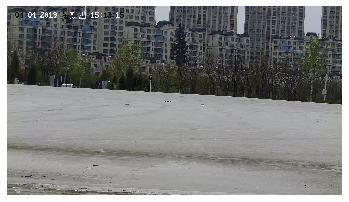

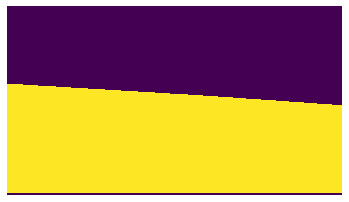

In [8]:
plot_image("192.168.1.64_01_201904041512554.jpg")
plot_mask("192.168.1.64_01_201904041512554.jpg")

# Define Data Augmentation methods

In [9]:
#def randomHueSaturationValue(image, hue_shift_limit=(-180, 180),
#                             sat_shift_limit=(-255, 255),
#                             val_shift_limit=(-255, 255), u=0.5):
def randomHueSaturationValue(image, hue_shift_limit=(-18, 18),
                             sat_shift_limit=(-25, 25),
                             val_shift_limit=(-25, 25), u=0.5):
    if np.random.random() < u:
        image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
        h, s, v = cv2.split(image)
        hue_shift = np.random.uniform(hue_shift_limit[0], hue_shift_limit[1])
        h = cv2.add(h, hue_shift)
        sat_shift = np.random.uniform(sat_shift_limit[0], sat_shift_limit[1])
        s = cv2.add(s, sat_shift)
        val_shift = np.random.uniform(val_shift_limit[0], val_shift_limit[1])
        v = cv2.add(v, val_shift)
        image = cv2.merge((h, s, v))
        image = cv2.cvtColor(image, cv2.COLOR_HSV2RGB)
    return image

def randomShiftScaleRotate(image, mask,
                           shift_limit=(-0.0625, 0.0625),
                           scale_limit=(-0.1, 0.1),
                           rotate_limit=(-45, 45), aspect_limit=(0, 0),
                           borderMode=cv2.BORDER_REFLECT_101, u=0.5):
    if np.random.random() < u:
        height, width, channel = image.shape

        angle = np.random.uniform(rotate_limit[0], rotate_limit[1])  # degree
        scale = np.random.uniform(1 + scale_limit[0], 1 + scale_limit[1])
        aspect = np.random.uniform(1 + aspect_limit[0], 1 + aspect_limit[1])
        sx = scale * aspect / (aspect ** 0.5)
        sy = scale / (aspect ** 0.5)
        dx = round(np.random.uniform(shift_limit[0], shift_limit[1]) * width)
        dy = round(np.random.uniform(shift_limit[0], shift_limit[1]) * height)

        cc = np.math.cos(angle / 180 * np.math.pi) * sx
        ss = np.math.sin(angle / 180 * np.math.pi) * sy
        rotate_matrix = np.array([[cc, -ss], [ss, cc]])

        box0 = np.array([[0, 0], [width, 0], [width, height], [0, height], ])
        box1 = box0 - np.array([width / 2, height / 2])
        box1 = np.dot(box1, rotate_matrix.T) + np.array([width / 2 + dx, height / 2 + dy])

        box0 = box0.astype(np.float32)
        box1 = box1.astype(np.float32)
        mat = cv2.getPerspectiveTransform(box0, box1)
        image = cv2.warpPerspective(image, mat, (width, height), flags=cv2.INTER_LINEAR, borderMode=borderMode,
                                    borderValue=(0, 0, 0,))
        mask = cv2.warpPerspective(mask, mat, (width, height), flags=cv2.INTER_LINEAR, borderMode=borderMode,
                                   borderValue=(0, 0, 0,))
        if len(mask.shape) == 2:
            mask = np.expand_dims(mask, axis=2)

    return image, mask

def randomHorizontalFlip(image, mask, u=0.5):
    if np.random.random() < u:
        image = cv2.flip(image, 1)
        mask = cv2.flip(mask, 1)

    return image, mask

# Define methods for batch generation

In [10]:
def generate_training_batch(data, batch_size):
    while True:
        X_batch = []
        Y_batch = []
        batch_ids = np.random.choice(data,
                                     size=batch_size,
                                     replace=False)
        for idx, img_id in enumerate(batch_ids):
            x = get_image(img_id)
            y = get_mask(img_id)
            x, y = randomShiftScaleRotate(x, y,
                                          shift_limit=(-0.0625, 0.0625),
                                          scale_limit=(-0.1, 0.1),
                                          rotate_limit=(-0, 0))
            x = randomHueSaturationValue(x,
                                hue_shift_limit=(-50, 50),
                                sat_shift_limit=(-5, 5),
                                val_shift_limit=(-15, 15))
            X_batch.append(x)
            Y_batch.append(y)
        X = np.asarray(X_batch, dtype=np.float32)
        Y = np.asarray(Y_batch, dtype=np.float32)
        yield X, Y

def generate_validation_batch(data, batch_size):
    while True:
        X_batch = []
        Y_batch = []
        batch_ids = np.random.choice(data,
                                     size=batch_size,
                                     replace=False)
        for idx, img_id in enumerate(batch_ids):
            x = get_image(img_id)
            y = get_mask(img_id)
            X_batch.append(x)
            Y_batch.append(y)
        X = np.asarray(X_batch, dtype=np.float32)
        Y = np.asarray(Y_batch, dtype=np.float32)
        yield X, Y

def generate_validation_data_seq(data):
    idx = 0
    while True:
        img_id = data[idx]
        X = get_image(img_id)
        Y = get_mask(img_id)
        yield img_id, X, Y
        idx  += 1
        if idx >= len(data):
            break

def get_model_memory_usage(batch_size, model):
    from keras import backend as K

    shapes_mem_count = 0
    for l in model.layers:
        single_layer_mem = 1
        for s in l.output_shape:
            if s is None:
                continue
            single_layer_mem *= s
        shapes_mem_count += single_layer_mem

    trainable_count = int(np.sum([K.count_params(p) for p in set(model.trainable_weights)]))
    non_trainable_count = int(np.sum([K.count_params(p) for p in set(model.non_trainable_weights)]))

    total_memory = 4*batch_size*(shapes_mem_count + trainable_count + non_trainable_count)
    gbytes = round(total_memory / (1024 ** 3), 3)
    mbytes = round(total_memory / (1024 ** 2), 3)
    
    print('trainable_count', trainable_count, 'non_trainable_count', non_trainable_count, 'gbytes', gbytes, 'mbytes', mbytes)

# Impact of random shift scale rotate

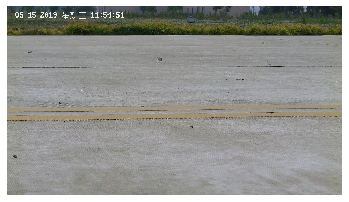

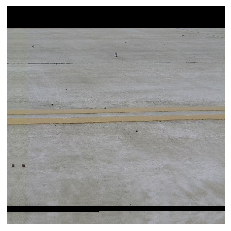

In [11]:
# Visualize impact of random shift scale rotate
random_idx = np.random.randint(len(train_imgs.keys()))
random_img_id = list(train_imgs.keys())[random_idx]
plot_image(random_img_id)
temp_img = get_image(random_img_id)
mask = get_mask(random_img_id)
temp_img, temp_mask = randomShiftScaleRotate(temp_img, mask,
                              shift_limit=(-0.0625, 0.0625),
                              scale_limit=(-0.1, 0.1),
                              rotate_limit=(-0, 0))

plt.imshow(temp_img * gray2rgb(temp_mask))
plt.axis('off')
plt.show()

# Impact of random hue saturation

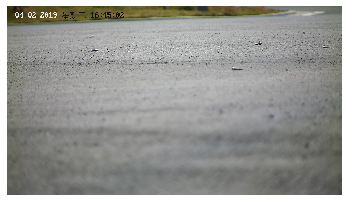

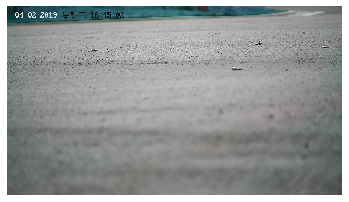

In [12]:
# Visualize impact of random hue saturation
random_idx = np.random.randint(len(train_imgs.keys()))
random_img_id = list(train_imgs.keys())[random_idx]
plot_image(random_img_id)
temp_img = cv2.imread(os.path.join(TRAIN_PATH, random_img_id))#'{}.jpg'.format(random_img_id)))
temp_img = randomHueSaturationValue(temp_img,
                               hue_shift_limit=(-50, 50),
                               sat_shift_limit=(-5, 5),
                               val_shift_limit=(-15, 15))
plt.imshow(temp_img)
plt.axis('off')
plt.show()

# Define U-Net model

In [13]:
def down(filters, input_):
    down_ = Conv2D(filters, (3, 3), padding='same')(input_)
    down_ = BatchNormalization(epsilon=1e-4)(down_)
    down_ = Activation('relu')(down_)
    down_ = Conv2D(filters, (3, 3), padding='same')(down_)
    down_ = BatchNormalization(epsilon=1e-4)(down_)
    down_res = Activation('relu')(down_)
    down_pool = MaxPooling2D((2, 2), strides=(2, 2))(down_)
    return down_pool, down_res

def up(filters, input_, down_):
    up_ = UpSampling2D((2, 2))(input_)
    up_ = concatenate([down_, up_], axis=3)
    up_ = Conv2D(filters, (3, 3), padding='same')(up_)
    up_ = BatchNormalization(epsilon=1e-4)(up_)
    up_ = Activation('relu')(up_)
    up_ = Conv2D(filters, (3, 3), padding='same')(up_)
    up_ = BatchNormalization(epsilon=1e-4)(up_)
    up_ = Activation('relu')(up_)
    up_ = Conv2D(filters, (3, 3), padding='same')(up_)
    up_ = BatchNormalization(epsilon=1e-4)(up_)
    up_ = Activation('relu')(up_)
    return up_

In [14]:
def get_unet_1024(input_shape=(HEIGHT, WIDTH, CHANNELS), num_classes=1):
    inputs = Input(shape=input_shape)

    with tf.device('/gpu:0'):
        #down0b, down0b_res = down(8, inputs)
        down0a, down0a_res = down(24, inputs)
        down0, down0_res = down(64, down0a)
        down1, down1_res = down(128, down0)
        down2, down2_res = down(256, down1)
        down3, down3_res = down(512, down2)
        down4, down4_res = down(768, down3)

        center = Conv2D(768, (3, 3), padding='same')(down4)
        center = BatchNormalization(epsilon=1e-4)(center)
        center = Activation('relu')(center)
        
    with tf.device('/gpu:1'):
        center = Conv2D(768, (3, 3), padding='same')(center)
        center = BatchNormalization(epsilon=1e-4)(center)
        center = Activation('relu')(center)

        up4 = up(768, center, down4_res)
        up3 = up(512, up4, down3_res)
        up2 = up(256, up3, down2_res)
        up1 = up(128, up2, down1_res)
        up0 = up(64, up1, down0_res)
        up0a = up(24, up0, down0a_res)
        #up0b = up(8, up0a, down0b_res)

    classify = Conv2D(num_classes, (1, 1), activation='sigmoid', name='final_layer')(up0a)

    model = Model(inputs=inputs, outputs=classify)

    return model

In [15]:
# Build U-Net model
#def get_unet_1024(input_shape=(HEIGHT, WIDTH, CHANNELS), num_classes=1):
#    #inputs = Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
#    inputs = Input(shape=input_shape)
#    s = Lambda(lambda x: x / 255) (inputs)

#    c1 = Conv2D(16, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (s)
#    c1 = Dropout(0.1) (c1)
#    c1 = Conv2D(16, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c1)
#    p1 = MaxPooling2D((2, 2)) (c1)

#    c2 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (p1)
#    c2 = Dropout(0.1) (c2)
#    c2 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c2)
#    p2 = MaxPooling2D((2, 2)) (c2)

#    c3 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (p2)
#    c3 = Dropout(0.2) (c3)
#    c3 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c3)
#    p3 = MaxPooling2D((2, 2)) (c3)

#    c4 = Conv2D(128, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (p3)
#    c4 = Dropout(0.2) (c4)
#    c4 = Conv2D(128, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c4)
#    p4 = MaxPooling2D(pool_size=(2, 2)) (c4)

#    c5 = Conv2D(256, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (p4)
#    c5 = Dropout(0.3) (c5)
#    c5 = Conv2D(256, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c5)

#    u6 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same') (c5)
#    u6 = concatenate([u6, c4])
#    c6 = Conv2D(128, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (u6)
#    c6 = Dropout(0.2) (c6)
#    c6 = Conv2D(128, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c6)

#    u7 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same') (c6)
#    u7 = concatenate([u7, c3])
#    c7 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (u7)
#    c7 = Dropout(0.2) (c7)
#    c7 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c7)

#    u8 = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same') (c7)
#    u8 = concatenate([u8, c2])
#    c8 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (u8)
#    c8 = Dropout(0.1) (c8)
#    c8 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c8)

#    u9 = Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same') (c8)
#    u9 = concatenate([u9, c1], axis=3)
#    c9 = Conv2D(16, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (u9)
#    c9 = Dropout(0.1) (c9)
#    c9 = Conv2D(16, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c9)

#    outputs = Conv2D(num_classes, (1, 1), activation='sigmoid', name='final_layer') (c9)

#    model = Model(inputs=[inputs], outputs=[outputs])
#    #model.compile(optimizer='adam', loss='binary_crossentropy', metrics=[mean_iou])
#    #model.summary()
    
#    return model    

# Define Dice Coef evaluation

In [16]:
def dice_coef(y_true, y_pred, smooth=1):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

def dice_coef_loss(y_true, y_pred):
    return 1-dice_coef(y_true, y_pred)

def bce_dice_loss(y_true, y_pred):
    return binary_crossentropy(y_true, y_pred) + dice_coef_loss(y_true, y_pred)

In [17]:
def weighted_bce_loss(y_true, y_pred, weight):
    # avoiding overflow
    epsilon = 1e-7
    y_pred = K.clip(y_pred, epsilon, 1. - epsilon)
    logit_y_pred = K.log(y_pred / (1. - y_pred))
    
    # https://www.tensorflow.org/api_docs/python/tf/nn/weighted_cross_entropy_with_logits
    loss = (1. - y_true) * logit_y_pred + (1. + (weight - 1.) * y_true) * \
    (K.log(1. + K.exp(-K.abs(logit_y_pred))) + K.maximum(-logit_y_pred, 0.))
    return K.sum(loss) / K.sum(weight)

def weighted_dice_coef(y_true, y_pred, weight):
    smooth = 1.
    w, m1, m2 = weight * weight, y_true, y_pred
    intersection = (m1 * m2)
    score = (2. * K.sum(w * intersection) + smooth) / (K.sum(w * m1) + K.sum(w * m2) + smooth)
    return score

def weighted_dice_loss(y_true, y_pred, weight):
    return 1. - weighted_dice_coef(y_true, y_pred, weight)

def weighted_bce_dice_loss(y_true, y_pred):
    y_true = K.cast(y_true, 'float32')
    y_pred = K.cast(y_pred, 'float32')
    # if we want to get same size of output, kernel size must be odd number
    averaged_mask = K.pool2d(y_true, pool_size=(11, 11), strides=(1, 1), padding='same', pool_mode='avg')
    border = K.cast(K.greater(averaged_mask, 0.01), 'float32') * K.cast(K.less(averaged_mask, 0.99), 'float32')
    weight = K.ones_like(averaged_mask)
    w0 = K.sum(weight)
    weight += border * 2
    w1 = K.sum(weight)
    weight *= (w0 / w1)
    loss = weighted_bce_loss(y_true, y_pred, weight) + weighted_dice_loss(y_true, y_pred, weight)
    return loss

# Train the model

In [18]:
BATCH_SIZE = 1
# Training new model
ts = str(int(time.time()))
model_name = 'malhot'
num_epochs = 30
steps_per_epoch = int(len(img_ids) * 0.8/BATCH_SIZE)
run_name = 'model={}-batch_size={}-num_epoch={}-steps_per_epoch={}-ts={}'.format(model_name,
                                                                          BATCH_SIZE,
                                                                          num_epochs,
                                                                          steps_per_epoch,
                                                                          ts)
tensorboard_loc = os.path.join(TENSORBOARD_PATH, run_name)
checkpoint_loc = os.path.join(MODELS_PATH,'model-1555053470.h5')

earlyStopping = EarlyStopping(monitor='val_loss', 
                              patience=10, 
                              verbose=1, 
                              min_delta = 0.0001,
                              mode='min',)

modelCheckpoint = ModelCheckpoint(checkpoint_loc,
                                  monitor = 'val_loss', 
                                  save_best_only = True, 
                                  mode = 'min', 
                                  verbose = 1,
                                  save_weights_only = True)

tensorboard = TensorBoard(log_dir=tensorboard_loc, histogram_freq=0, write_graph=True, write_images=True)

callbacks_list = [modelCheckpoint, earlyStopping, tensorboard]

model = get_unet_1024()
model.compile(loss=bce_dice_loss, optimizer=Adam(lr=1e-4), metrics=[dice_coef])
print(model.summary())
get_model_memory_usage(BATCH_SIZE, model)


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 512, 512, 3)  0                                            
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 512, 512, 24) 672         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization_1 (BatchNor (None, 512, 512, 24) 96          conv2d_1[0][0]                   
__________________________________________________________________________________________________
activation_1 (Activation)       (None, 512, 512, 24) 0           batch_normalization_1[0][0]    

In [19]:
# # Re-training old model
BATCH_SIZE = 1
ts = str(int(time.time()))
model_name = 'malhot'
num_epochs = 300
steps_per_epoch = 101
run_name = 'model={}-batch_size={}-num_epoch={}-steps_per_epoch={}-ts={}'.format(model_name,
                                                                          BATCH_SIZE,
                                                                          num_epochs,
                                                                          steps_per_epoch,
                                                                          ts)
tensorboard_loc = os.path.join(TENSORBOARD_PATH, run_name)
checkpoint_loc = os.path.join(MODELS_PATH, 'model-1555053470.h5')

modelCheckpoint = ModelCheckpoint(checkpoint_loc,
                                  monitor = 'val_loss', 
                                  save_best_only = True, 
                                  mode = 'min', 
                                  verbose = 1,
                                  save_weights_only = True)

tensorboard = TensorBoard(log_dir=tensorboard_loc, histogram_freq=0, write_graph=True, write_images=True)

callbacks_list = [modelCheckpoint, tensorboard]

model = get_unet_1024()
model.load_weights(os.path.join(MODELS_PATH, 'model-1555053470.h5'))
model.compile(loss=weighted_bce_dice_loss, optimizer=Adam(lr=1e-5), metrics=[dice_coef])
model.summary()



Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 512, 512, 3)  0                                            
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 512, 512, 24) 672         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization_1 (BatchNor (None, 512, 512, 24) 96          conv2d_1[0][0]                   
__________________________________________________________________________________________________
activation_1 (Activation)       (None, 512, 512, 24) 0           batch_normalization_1[0][0]      
__________________________________________________________________________________________

In [20]:
train_ids, validation_ids = model_selection.train_test_split(img_ids, random_state=42, test_size=0.20)
train_generator = generate_training_batch(train_ids, BATCH_SIZE)
valid_generator = generate_validation_batch(validation_ids, BATCH_SIZE)
VALIDATION_STEPS = int(len(validation_ids) / BATCH_SIZE)

In [21]:
#train_generator = generate_training_batch(train_ids, BATCH_SIZE)
#VALIDATION_STEPS = int(len(validation_ids) / BATCH_SIZE)
H = model.fit_generator(train_generator, validation_data=valid_generator, validation_steps=VALIDATION_STEPS, steps_per_epoch = 101, epochs = 300, callbacks=callbacks_list)

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where



Epoch 1/300
101/101 [==============================] - 75s 747ms/step - loss: 0.2657 - dice_coef: 0.9152 - val_loss: 0.2413 - val_dice_coef: 0.9403

Epoch 00001: val_loss improved from inf to 0.24127, saving model to /workspace/dataset\models\model-1555053470.h5

Epoch 2/300
101/101 [==============================] - 63s 625ms/step - loss: 0.2524 - dice_coef: 0.9108 - val_loss: 0.1948 - val_dice_coef: 0.9397

Epoch 00002: val_loss improved from 0.24127 to 0.19475, saving model to /workspace/dataset\models\model-1555053470.h5
Epoch 3/300
101/101 [==============================] - 63s 625ms/step - loss: 0.2275 - dice_coef: 0.9262 - val_loss: 0.1863 - val_dice_coef: 0.9251

Epoch 00003: val_loss improved from 0.19475 to 0.18635, saving model to /workspace/dataset\models\model-1555053470.h5
Epoch 4/300
101/101 [==============================] - 63s 626ms/step - loss: 0.2467 - dice_coef: 0.9236 

101/101 [==============================] - 63s 627ms/step - loss: 0.1865 - dice_coef: 0.9357 - val_loss: 0.1512 - val_dice_coef: 0.9430

Epoch 00033: val_loss did not improve from 0.10999
Epoch 34/300
101/101 [==============================] - 63s 627ms/step - loss: 0.1974 - dice_coef: 0.9300 - val_loss: 0.5005 - val_dice_coef: 0.9377

Epoch 00034: val_loss did not improve from 0.10999
Epoch 35/300
101/101 [==============================] - 63s 627ms/step - loss: 0.1924 - dice_coef: 0.9392 - val_loss: 0.1373 - val_dice_coef: 0.9355

Epoch 00035: val_loss did not improve from 0.10999
Epoch 36/300
101/101 [==============================] - 63s 628ms/step - loss: 0.1992 - dice_coef: 0.9316 - val_loss: 0.1826 - val_dice_coef: 0.9447

Epoch 00036: val_loss did not improve from 0.10999
Epoch 37/300
101/101 [==============================] - 63s 628ms/step - loss: 0.2473 - dice_coef: 0.9215 - val_loss: 0.1782 - val_dice_coef: 0.9491

Epoch 00037: val_loss did not improve from 0.10999
Epoch 38

101/101 [==============================] - 63s 627ms/step - loss: 0.1683 - dice_coef: 0.9445 - val_loss: 0.0961 - val_dice_coef: 0.9556

Epoch 00073: val_loss did not improve from 0.09059
Epoch 74/300
101/101 [==============================] - 63s 627ms/step - loss: 0.1503 - dice_coef: 0.9493 - val_loss: 0.0890 - val_dice_coef: 0.9459

Epoch 00074: val_loss improved from 0.09059 to 0.08901, saving model to /workspace/dataset\models\model-1555053470.h5
Epoch 75/300
101/101 [==============================] - 63s 627ms/step - loss: 0.1649 - dice_coef: 0.9531 - val_loss: 0.1024 - val_dice_coef: 0.9420

Epoch 00075: val_loss did not improve from 0.08901
Epoch 76/300
101/101 [==============================] - 63s 627ms/step - loss: 0.1628 - dice_coef: 0.9489 - val_loss: 0.1933 - val_dice_coef: 0.9570

Epoch 00076: val_loss did not improve from 0.08901
Epoch 77/300
101/101 [==============================] - 63s 627ms/step - loss: 0.1630 - dice_coef: 0.9543 - val_loss: 0.1039 - val_dice_coef: 

101/101 [==============================] - 63s 627ms/step - loss: 0.1308 - dice_coef: 0.9601 - val_loss: 0.1243 - val_dice_coef: 0.9577

Epoch 00113: val_loss did not improve from 0.06558
Epoch 114/300
101/101 [==============================] - 63s 627ms/step - loss: 0.1421 - dice_coef: 0.9532 - val_loss: 0.0824 - val_dice_coef: 0.9465

Epoch 00114: val_loss did not improve from 0.06558
Epoch 115/300
101/101 [==============================] - 63s 627ms/step - loss: 0.1370 - dice_coef: 0.9598 - val_loss: 0.0993 - val_dice_coef: 0.9607

Epoch 00115: val_loss did not improve from 0.06558
Epoch 116/300
101/101 [==============================] - 63s 628ms/step - loss: 0.1429 - dice_coef: 0.9567 - val_loss: 0.1137 - val_dice_coef: 0.9603

Epoch 00116: val_loss did not improve from 0.06558
Epoch 117/300
101/101 [==============================] - 63s 628ms/step - loss: 0.1281 - dice_coef: 0.9609 - val_loss: 0.1720 - val_dice_coef: 0.9551

Epoch 00117: val_loss did not improve from 0.06558
Epoc

101/101 [==============================] - 63s 626ms/step - loss: 0.1296 - dice_coef: 0.9608 - val_loss: 2.1932 - val_dice_coef: 0.9538

Epoch 00153: val_loss did not improve from 0.06529
Epoch 154/300
101/101 [==============================] - 63s 626ms/step - loss: 0.1303 - dice_coef: 0.9634 - val_loss: 0.0483 - val_dice_coef: 0.9673

Epoch 00154: val_loss improved from 0.06529 to 0.04834, saving model to /workspace/dataset\models\model-1555053470.h5
Epoch 155/300
101/101 [==============================] - 63s 626ms/step - loss: 0.1327 - dice_coef: 0.9544 - val_loss: 0.0777 - val_dice_coef: 0.9694

Epoch 00155: val_loss did not improve from 0.04834
Epoch 156/300
101/101 [==============================] - 63s 626ms/step - loss: 0.1271 - dice_coef: 0.9658 - val_loss: 0.1394 - val_dice_coef: 0.9671

Epoch 00156: val_loss did not improve from 0.04834
Epoch 157/300
101/101 [==============================] - 63s 626ms/step - loss: 0.1349 - dice_coef: 0.9580 - val_loss: 0.1670 - val_dice_co


Epoch 00192: val_loss did not improve from 0.04315
Epoch 193/300
101/101 [==============================] - 63s 626ms/step - loss: 0.1007 - dice_coef: 0.9765 - val_loss: 0.1749 - val_dice_coef: 0.9752

Epoch 00193: val_loss did not improve from 0.04315
Epoch 194/300
101/101 [==============================] - 63s 626ms/step - loss: 0.1307 - dice_coef: 0.9581 - val_loss: 0.0827 - val_dice_coef: 0.9783

Epoch 00194: val_loss did not improve from 0.04315
Epoch 195/300
101/101 [==============================] - 63s 625ms/step - loss: 0.1112 - dice_coef: 0.9711 - val_loss: 0.1471 - val_dice_coef: 0.9659

Epoch 00195: val_loss did not improve from 0.04315
Epoch 196/300
101/101 [==============================] - 63s 626ms/step - loss: 0.1144 - dice_coef: 0.9655 - val_loss: 0.0646 - val_dice_coef: 0.9739

Epoch 00196: val_loss did not improve from 0.04315
Epoch 197/300
101/101 [==============================] - 63s 626ms/step - loss: 0.1153 - dice_coef: 0.9699 - val_loss: 0.1119 - val_dice_coe

101/101 [==============================] - 63s 626ms/step - loss: 0.1193 - dice_coef: 0.9586 - val_loss: 0.1263 - val_dice_coef: 0.9716

Epoch 00233: val_loss did not improve from 0.04315
Epoch 234/300
101/101 [==============================] - 63s 626ms/step - loss: 0.1109 - dice_coef: 0.9709 - val_loss: 0.0678 - val_dice_coef: 0.9823

Epoch 00234: val_loss did not improve from 0.04315
Epoch 235/300
101/101 [==============================] - 63s 626ms/step - loss: 0.1087 - dice_coef: 0.9663 - val_loss: 0.0694 - val_dice_coef: 0.9786

Epoch 00235: val_loss did not improve from 0.04315
Epoch 236/300
101/101 [==============================] - 63s 626ms/step - loss: 0.1142 - dice_coef: 0.9570 - val_loss: 0.1174 - val_dice_coef: 0.9807

Epoch 00236: val_loss did not improve from 0.04315
Epoch 237/300
101/101 [==============================] - 63s 626ms/step - loss: 0.1053 - dice_coef: 0.9704 - val_loss: 0.0954 - val_dice_coef: 0.9735

Epoch 00237: val_loss did not improve from 0.04315
Epoc

101/101 [==============================] - 63s 626ms/step - loss: 0.1024 - dice_coef: 0.9758 - val_loss: 0.0822 - val_dice_coef: 0.9842

Epoch 00273: val_loss did not improve from 0.03736
Epoch 274/300
101/101 [==============================] - 63s 626ms/step - loss: 0.1006 - dice_coef: 0.9792 - val_loss: 0.1118 - val_dice_coef: 0.9791

Epoch 00274: val_loss did not improve from 0.03736
Epoch 275/300
101/101 [==============================] - 63s 626ms/step - loss: 0.0822 - dice_coef: 0.9825 - val_loss: 0.1210 - val_dice_coef: 0.9787

Epoch 00275: val_loss did not improve from 0.03736
Epoch 276/300
101/101 [==============================] - 63s 626ms/step - loss: 0.1139 - dice_coef: 0.9642 - val_loss: 0.0768 - val_dice_coef: 0.9765

Epoch 00276: val_loss did not improve from 0.03736
Epoch 277/300
101/101 [==============================] - 63s 625ms/step - loss: 0.1033 - dice_coef: 0.9739 - val_loss: 0.7159 - val_dice_coef: 0.9752

Epoch 00277: val_loss did not improve from 0.03736
Epoc

In [22]:
model.save_weights(os.path.join(MODELS_PATH, 'model-1555053470-ex2.h5'))

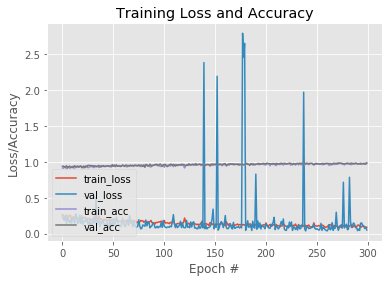

In [24]:
# plot the training loss and accuracy
plt.style.use("ggplot")
plt.figure()
N = 300
plt.plot(np.arange(0, N), H.history["loss"], label="train_loss")
plt.plot(np.arange(0, N), H.history["val_loss"], label="val_loss")
plt.plot(np.arange(0, N), H.history["dice_coef"], label="train_acc")
plt.plot(np.arange(0, N), H.history["val_dice_coef"], label="val_acc")
plt.title("Training Loss and Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend(loc="lower left")



In [22]:
model = get_unet_1024()
model.load_weights(os.path.join(MODELS_PATH, 'model-1555053470.h5'))
model.compile(loss=bce_dice_loss, optimizer=Adam(1e-5), metrics=[dice_coef])

OSError: Unable to open file (unable to open file: name = 'data\models\model-1555053470.h5', errno = 2, error message = 'No such file or directory', flags = 0, o_flags = 0)

In [34]:
model.evaluate_generator(valid_generator, VALIDATION_STEPS)

[0.03875337541103363, 0.9638078808784485]

### Error analysis on validation set

In [ ]:
validation_dices = []
for img_id, X, Y in generate_validation_data_seq(validation_ids):
    error = model.evaluate(np.expand_dims(X, axis=0), np.expand_dims(Y, axis=0), verbose=0)
    validation_dices.append((img_id, error[0], error[1]))

val_eval_df = pd.DataFrame.from_records(validation_dices, columns=['img_id', 'val_loss', 'dice_coef'])
val_eval_df.head()

In [ ]:
val_eval_df.to_csv(os.path.join(DATA_PATH, 'val_eval_df-1506223599.csv'), index=False)
val_eval_df = pd.read_csv(os.path.join(DATA_PATH, 'val_eval_df-1506223599.csv'))

def get_outliers(data, col, m=2):
    return data[(data[col] - np.mean(data[col])) < -1.0 * (m * np.std(data[col]))]
outlier_df = get_outliers(val_eval_df, 'dice_coef', 2)
outlier_df = outlier_df.sort_values('dice_coef')
print(outlier_df.shape)
outlier_df

In [ ]:
for img_id in outlier_df.img_id.tolist():
    print(img_id, outlier_df[outlier_df.img_id == img_id].values.tolist()[0][2])
    test_img = get_image(img_id)

    # Plot original image
    actual_img = load_image_disk(img_id)
    plt.figure(figsize=(15, 15))
    plt.imshow(actual_img)
    plt.axis('off')
    
    # Predict mask
    pred_mask = model.predict(np.expand_dims(test_img, axis=0))
    
    # Plot predicted mask
    pred_mask = np.squeeze(pred_mask)    
    pred_mask = resize_img(pred_mask, (HEIGHT_ORIG, WIDTH_ORIG))
    pred_mask[pred_mask <= 0.5] = 0
    pred_mask[pred_mask > 0.5] = 1
    
    # Plot ground truth mask
    mask = load_mask_disk(img_id)
    mask = np.squeeze(mask)
    mask = resize_img(mask, (HEIGHT_ORIG, WIDTH_ORIG))
        
    # Plot intersection (true_positives) of two masks
    true_positives = pred_mask * mask
    
    # Plot false positives (pred_mask == 1 && mask == 0)
    false_positives = np.zeros_like(mask)
    false_positives[(pred_mask == 1) & (mask == 0)] = 1
    
    # Plot false negatives (pred_mask == 0 && mask == 1)
    false_negatives = np.zeros_like(mask)
    false_negatives[(pred_mask == 0) & (mask == 1)] = 1

    # Plot true negatives (pred_mask == 0 && mask == 0)
    true_negatives = np.zeros_like(mask)
    true_negatives[(pred_mask == 0) & (mask == 0)] = 1
    
    # Plot merged mask 
    # Legend: 
    #   Red: false positives 
    #   Green: true positives
    #   Blue: false negatives
    #   Black: true negatives
    #   White: background (unclassified pixels) - this should never be visible
    rgb_merged_mask = np.zeros((HEIGHT_ORIG, WIDTH_ORIG, CHANNELS_ORIG))
    rgb_merged_mask = 255 # White
    rgb_true_positives = gray2rgb(true_positives)
    rgb_false_positives = gray2rgb(false_positives)
    rgb_false_negatives = gray2rgb(false_negatives)
    rgb_true_negatives = gray2rgb(true_negatives)

    rgb_merged_mask = rgb_true_positives + rgb_false_positives + rgb_false_negatives + rgb_true_negatives
    rgb_merged_mask[true_positives == 1] = [0, 255, 0] # Green
    rgb_merged_mask[false_positives == 1] = [255, 0, 0] # Red
    rgb_merged_mask[false_negatives == 1] = [0, 0, 255] # Blue
    rgb_merged_mask[true_negatives == 1] = [0, 0, 0] # Black
    
    plt.figure(figsize=(15, 15))
    plt.imshow(rgb_merged_mask)
    plt.axis('off')
    plt.show()

In [ ]:
# Helper methods
def rle_encode(mask_image):
    pixels = mask_image.flatten()
    # We avoid issues with '1' at the start or end (at the corners of 
    # the original image) by setting those pixels to '0' explicitly.
    # We do not expect these to be non-zero for an accurate mask, 
    # so this should not harm the score.
    pixels[0] = 0
    pixels[-1] = 0
    runs = np.where(pixels[1:] != pixels[:-1])[0] + 2
    runs[1::2] = runs[1::2] - runs[:-1:2]
    return runs

def rle_decode(mask_rle, shape):
    '''
    mask_rle: run-length as string formated (start length)
    shape: (height,width) of array to return 
    Returns numpy array, 1 - mask, 0 - background

    '''
    s = mask_rle.split()
    starts, lengths = [np.asarray(x, dtype=int) for x in (s[0:][::2], s[1:][::2])]
    starts -= 1
    ends = starts + lengths
    img = np.zeros(shape[0]*shape[1], dtype=np.uint8)
    for lo, hi in zip(starts, ends):
        img[lo:hi] = 1
    return img.reshape(shape)

def rle_to_string(runs):
    return ' '.join(str(x) for x in runs)

def load_imgs(img_ids, folder=TRAIN_PATH):
    imgs = []
    for img_id in img_ids:
        img = misc.imread(os.path.join(folder, img_id + ".jpg"))
        imgs.append(img)
    return np.asarray(imgs)

def resize_imgs(imgs, factor=0.1):
    resized_imgs = []
    for img in imgs:
        resized_img = rescale(img, factor)
        resized_imgs.append(resized_img)
    return np.asarray(resized_imgs)

def rescale_and_clean_masks(masks):
    clean_masks = np.zeros((masks.shape[0], HEIGHT_ORIG, WIDTH_ORIG, 1), dtype=np.uint8)
    for i in range(masks.shape[0]):        
        mask = resize(masks[i], (HEIGHT_ORIG, WIDTH_ORIG, 1))
        mask[mask <= 0.5] = 0
        mask[mask > 0.5] = 1
        clean_masks[i] = mask
    return clean_masks

def rle_masks(masks):  
    rles = []
    for i in range(masks.shape[0]):
        rles.append(rle_to_string(rle_encode(masks[i])))
    return rles

# Predict

In [26]:
model = get_unet_1024()
# Here you have to specify the concrete name of your saved model
model.load_weights(os.path.join(MODELS_PATH, 'model-1555053470.h5'))
model.compile(loss=bce_dice_loss, optimizer=Adam(1e-5), metrics=[dice_coef])

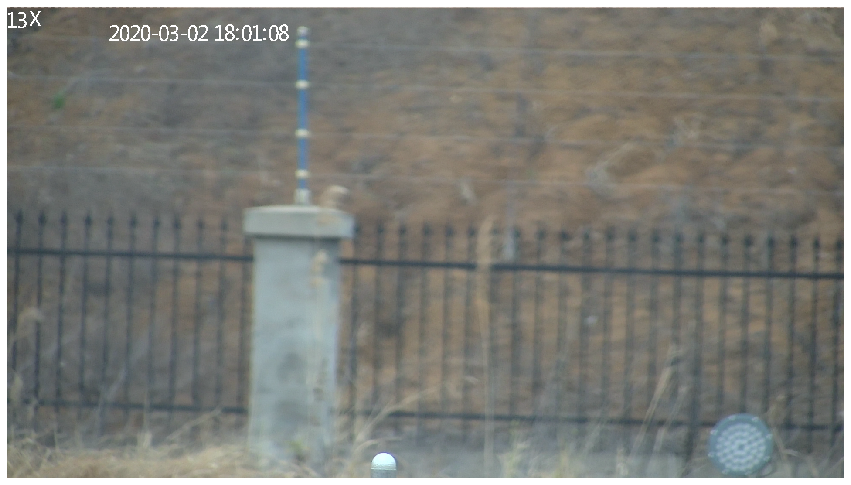

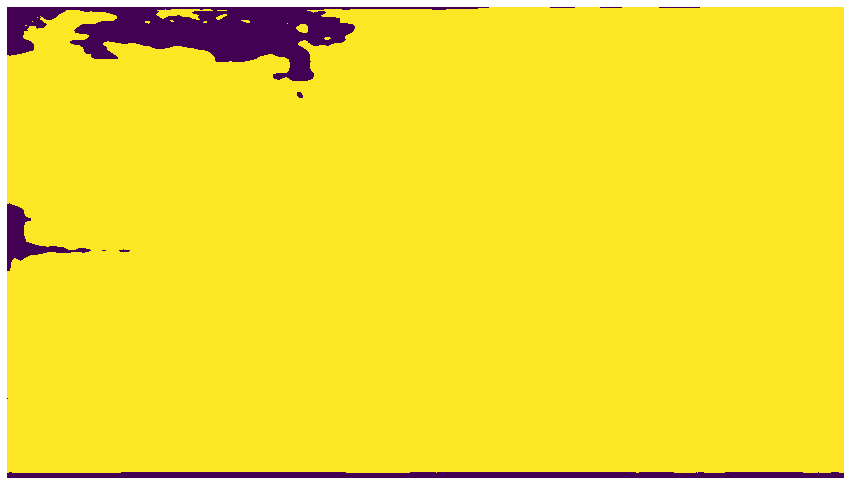

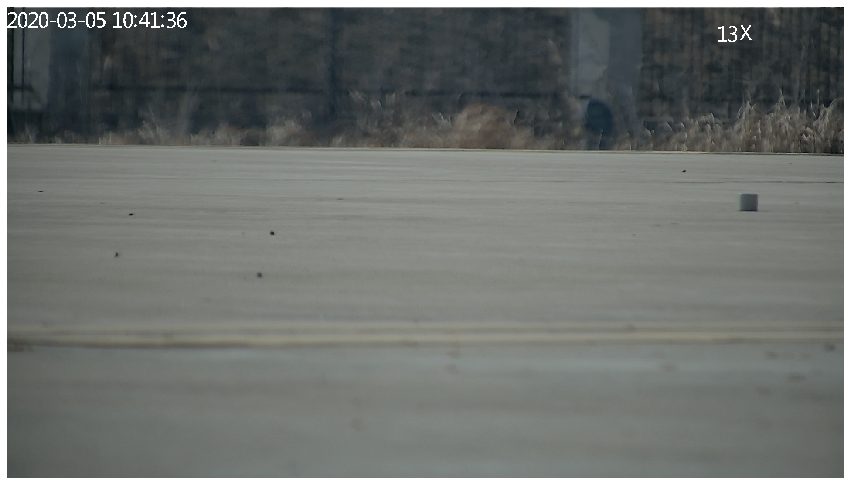

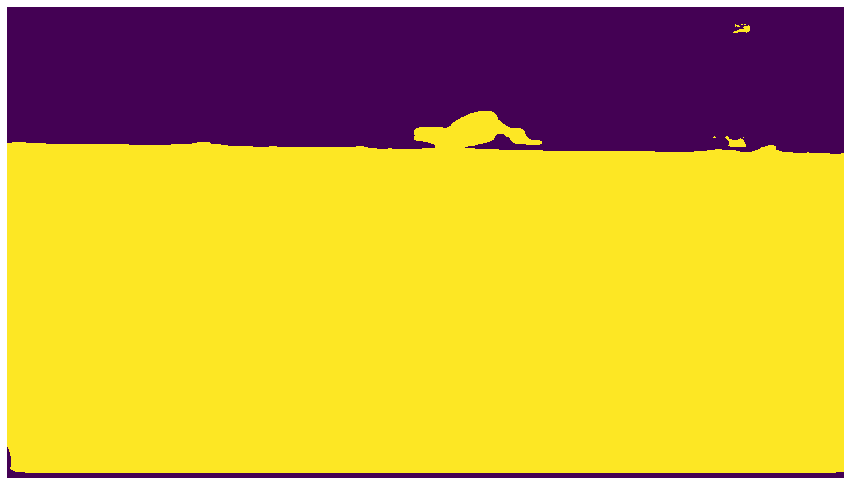

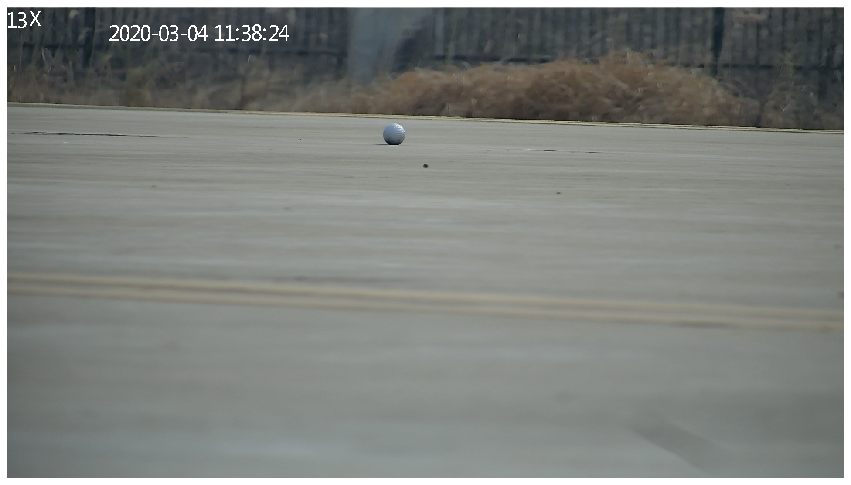

...

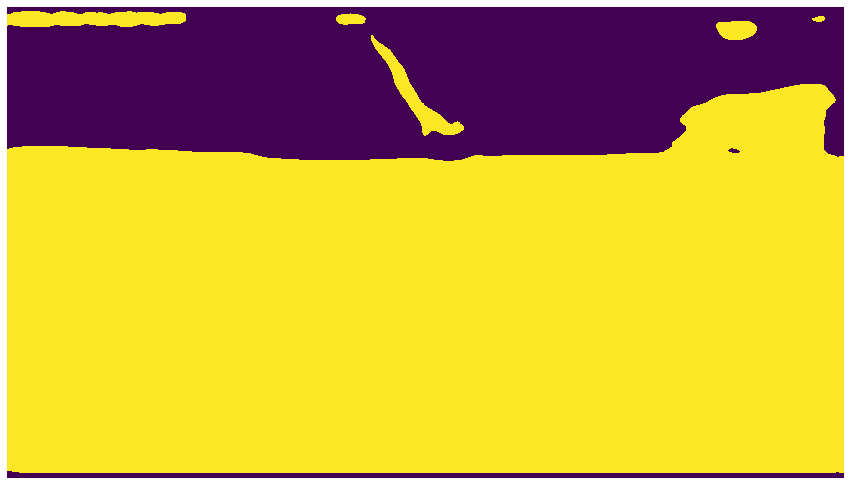

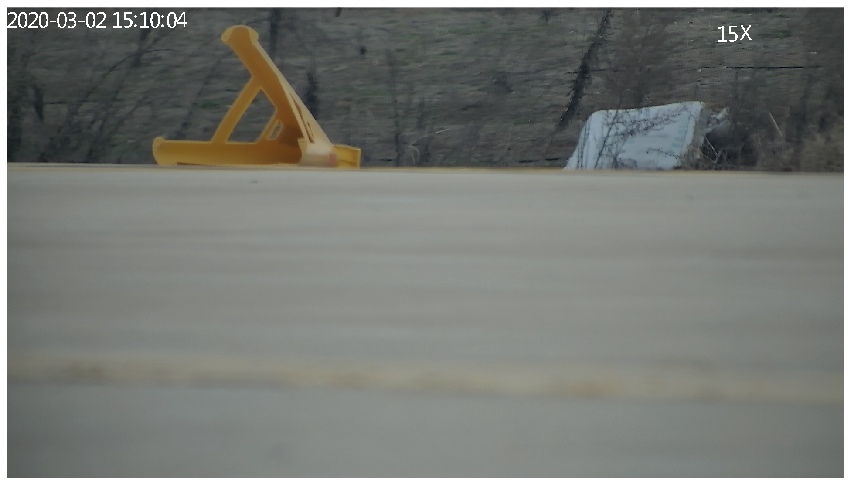

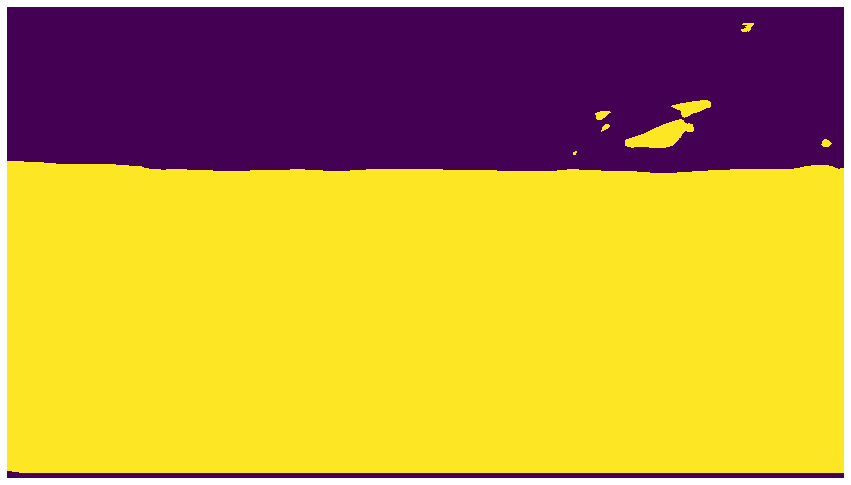

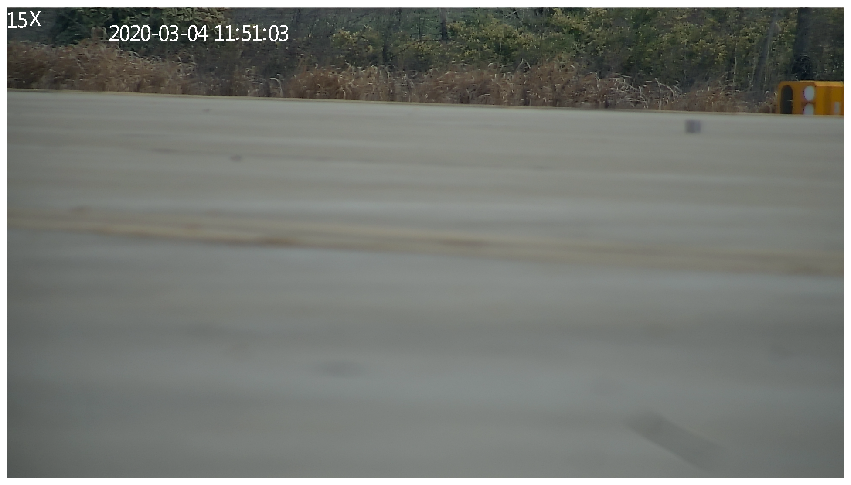

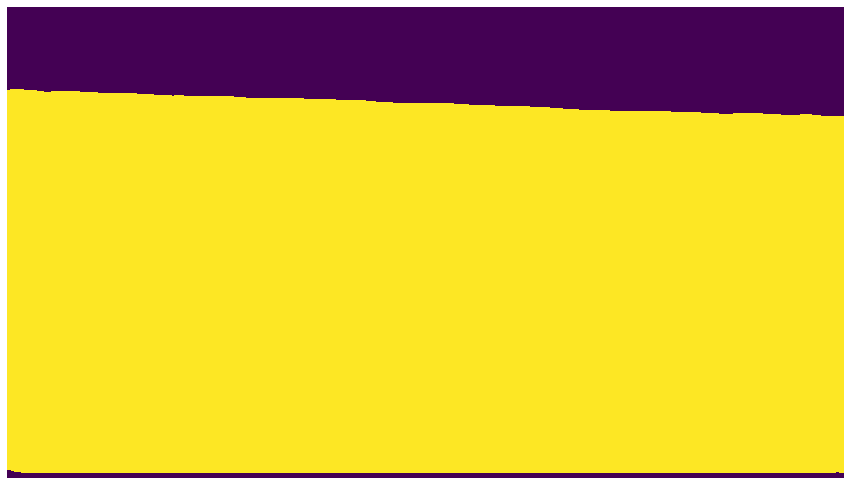

In [27]:
#TEST_PATH = TRAIN_PATH
#for img_path in os.listdir(TEST_PATH)[32000:32010]:
#for img_path in os.listdir(TEST_PATH)[5:17]:
for img_path in os.listdir(TEST_PATH):
    #if not os.path.isfile(os.path.join(TRAIN_PATH, img_path)):
    #    continue

    #print(img_id, outlier_df[outlier_df.img_id == img_id].values.tolist()[0][2])
    #test_img = get_image(img_id)
    img_id = img_path#get_img_id(img_path)
    
    # Plot original image
    actual_img = load_image_disk(img_id, TEST_PATH)
    plt.figure(figsize=(15, 15))
    plt.imshow(actual_img)
    plt.axis('off')
    
    test_img_cv2 = cv2.resize(actual_img, (new_shape[0], new_shape[1]))
    
    # Predict mask
    pred_mask = model.predict(np.expand_dims(test_img_cv2, axis=0))
    
    # Plot predicted mask
    pred_mask = np.squeeze(pred_mask)    
    pred_mask = resize_img(pred_mask, (HEIGHT_ORIG, WIDTH_ORIG))
    pred_mask[pred_mask <= 0.5] = 0
    pred_mask[pred_mask > 0.5] = 1
    
    plt.figure(figsize=(15, 15))
    plt.imshow(pred_mask)
    plt.axis('off')
    plt.show()